In [11]:
import zarr

base ="/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs"
cells_zarr = zarr.open(f"{base}/cell_feature_matrix.zarr.zip", mode='r')
print(cells_zarr.tree())

/
 └── cell_features
     ├── data (10807122,) uint32
     ├── indices (10807122,) uint32
     └── indptr (543,) uint32


In [13]:
import zarr

base ="/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs"
cells_zarr = zarr.open(f"{base}/transcripts.zarr.zip", mode='r')
print(cells_zarr.tree())

/
 ├── density
 │   └── gene
 │       ├── data (15304262,) uint16
 │       ├── indices (15304262,) uint16
 │       └── indptr (296469,) uint32
 └── grids
     ├── 0
     │   ├── -1,15
     │   │   ├── gene_identity (3, 1) uint16
     │   │   ├── id (3, 2) uint32
     │   │   ├── location (3, 3) float32
     │   │   ├── quality_score (3, 1) float32
     │   │   ├── status (3, 1) uint8
     │   │   ├── uuid (3, 2) uint32
     │   │   └── valid (3, 1) uint8
     │   ├── -1,16
     │   │   ├── gene_identity (2, 1) uint16
     │   │   ├── id (2, 2) uint32
     │   │   ├── location (2, 3) float32
     │   │   ├── quality_score (2, 1) float32
     │   │   ├── status (2, 1) uint8
     │   │   ├── uuid (2, 2) uint32
     │   │   └── valid (2, 1) uint8
     │   ├── -1,17
     │   │   ├── gene_identity (2, 1) uint16
     │   │   ├── id (2, 2) uint32
     │   │   ├── location (2, 3) float32
     │   │   ├── quality_score (2, 1) float32
     │   │   ├── status (2, 1) uint8
     │   │   ├── uuid (2,

In [ ]:
import zarr

base ="/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs"
cells_zarr = zarr.open(f"{base}/cells.zarr.zip", mode='r')
print(cells_zarr.tree())

/
 ├── cell_id (167780,) uint32
 ├── cell_summary (167780, 7) float64
 ├── homogeneous_transform (3, 3) float32
 ├── masks
 │   ├── 0 (25778, 35416) uint32
 │   ├── 1 (25778, 35416) uint32
 │   └── homogeneous_transform (4, 4) float32
 ├── polygon_num_vertices (2, 167780) int32
 └── polygon_vertices (2, 167780, 26) float32


Prepared 167780 cell boundaries


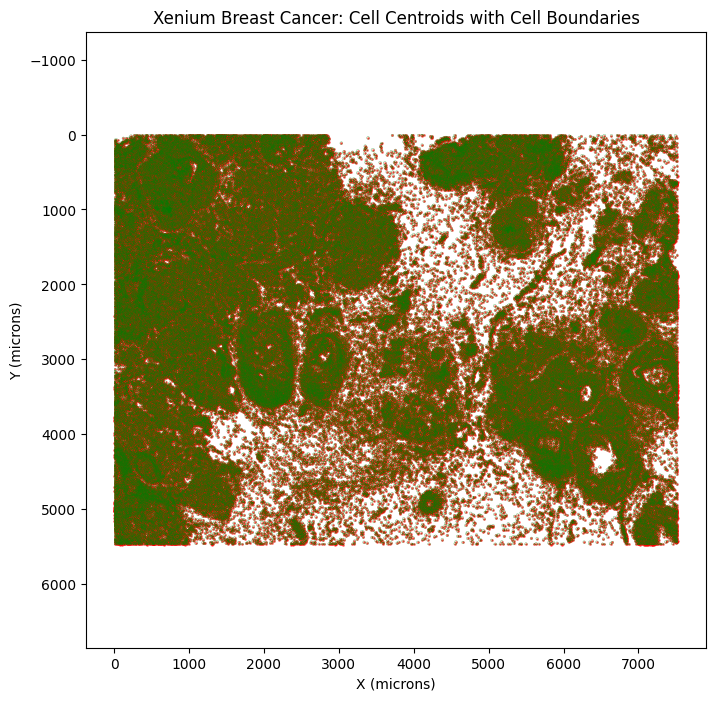

Saved figure to: xenium_centroids_with_cell_boundaries.png


In [6]:
import zarr
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

# --------------------------------------------------
# Load Xenium Zarr
# --------------------------------------------------
path = "/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs/cells.zarr.zip"
z = zarr.open(path, mode="r")

cell_summary = np.array(z["cell_summary"])
cell_ids = np.array(z["cell_id"])

polygon_vertices = z["polygon_vertices"]
polygon_num_vertices = z["polygon_num_vertices"]

# --------------------------------------------------
# Centroids (µm)
# --------------------------------------------------
x = cell_summary[:, 0]
y = cell_summary[:, 1]

# --------------------------------------------------
# Build cell boundary polygons (µm)
# 0 = nucleus, 1 = cell boundary
# --------------------------------------------------
POLY_SET_IDX = 1
segments = []

for idx in range(len(cell_ids)):
    n_vert = polygon_num_vertices[POLY_SET_IDX, idx]
    if n_vert < 3:
        continue

    poly_flat = polygon_vertices[POLY_SET_IDX, idx, :2 * n_vert]
    poly_um = poly_flat.reshape(-1, 2)

    # close polygon
    poly_um = np.vstack([poly_um, poly_um[0]])
    segments.append(poly_um)

print(f"Prepared {len(segments)} cell boundaries")

# --------------------------------------------------
# Plot
# --------------------------------------------------
plt.figure(figsize=(8, 8))

lc = LineCollection(
    segments,
    colors="green",
    linewidths=0.3,
    alpha=0.6
)
plt.gca().add_collection(lc)

plt.scatter(x, y, s=1, c="red", alpha=0.5)

plt.gca().invert_yaxis()
plt.title("Xenium Breast Cancer: Cell Centroids with Cell Boundaries")
plt.xlabel("X (microns)")
plt.ylabel("Y (microns)")
plt.axis("equal")

# --------------------------------------------------
# SAVE
# --------------------------------------------------
out_path = "xenium_centroids_with_cell_boundaries.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved figure to: {out_path}")

In [8]:
import h5py

path = "/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs/cell_feature_matrix.h5"

with h5py.File(path, "r") as f:
    print("Top-level keys:", list(f.keys()))
    print("\n--- MATRIX GROUP CONTENTS ---")
    for k, v in f["matrix"].items():
        if isinstance(v, h5py.Dataset):
            print(f"{k:10s} → shape: {v.shape}, dtype: {v.dtype}")
        elif isinstance(v, h5py.Group):
            print(f"{k:10s} → subgroup with keys: {list(v.keys())}")
            
with h5py.File(path, "r") as f:
    features = f["matrix"]["features"]
    print("Available feature keys:", list(features.keys()))
    
    # Check shape and dtype
    print("\nfeatures/name → shape:", features["name"].shape, ", dtype:", features["name"].dtype)
    
    # Show a few gene names
    names = [n.decode() for n in features["name"][:10]]
    print("\nFirst 10 gene names:", names)
    
import h5py
with h5py.File("/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs/cell_feature_matrix.h5", "r") as f:
    print("Matrix shape (genes, cells):", f["matrix"]["shape"][:])


Top-level keys: ['matrix']

--- MATRIX GROUP CONTENTS ---
barcodes   → shape: (167780,), dtype: |S6
data       → shape: (10640759,), dtype: int32
features   → subgroup with keys: ['_all_tag_keys', 'feature_type', 'genome', 'id', 'name']
indices    → shape: (10640759,), dtype: int64
indptr     → shape: (167781,), dtype: int64
shape      → shape: (2,), dtype: int32
Available feature keys: ['_all_tag_keys', 'feature_type', 'genome', 'id', 'name']

features/name → shape: (541,) , dtype: |S23

First 10 gene names: ['ABCC11', 'ACTA2', 'ACTG2', 'ADAM9', 'ADGRE5', 'ADH1B', 'ADIPOQ', 'AGR3', 'AHSP', 'AIF1']
Matrix shape (genes, cells): [   541 167780]


H&E alignment matrix:
    1.7125010585876286  0.008345081015717404  -10397.19948741904
0            0.008345             -1.712501        37211.538979
1            0.000000              0.000000            1.000000 

IF alignment matrix:
    -3.4762197159169843  0.025274618373475357  42481.91130271698
0            -0.025275              -3.47622       32408.771279
1             0.000000               0.00000           1.000000 

H&E shape: (24241, 30786, 3)
IF shape: (3, 9777, 14239)


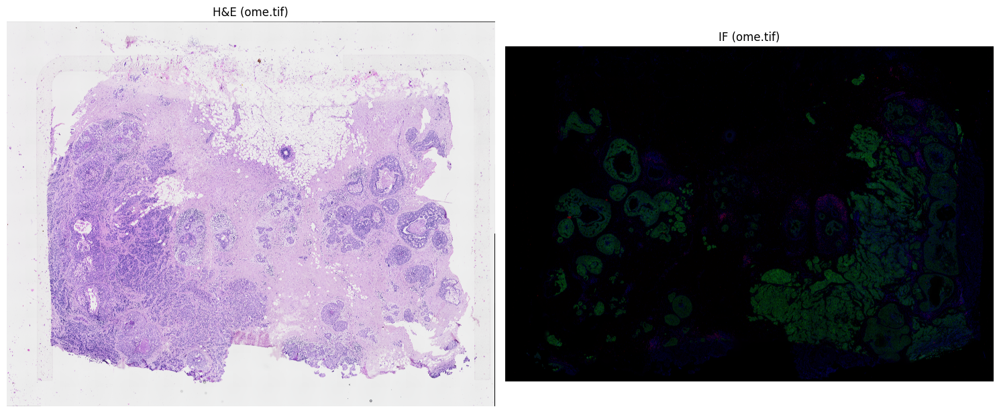

In [7]:
import tifffile
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

base = "/home/puneet/mk/data/10X_HumandBreastCancer_data"

# File paths
he_img = f"{base}/{prefix}_he_image.ome.tif"
if_img = f"{base}/{prefix}_if_image.ome.tif"
he_align = f"{base}/{prefix}_he_imagealignment.csv"
if_align = f"{base}/{prefix}_if_imagealignment.csv"

# 1️⃣ Load alignment matrices
he_affine = pd.read_csv(he_align)
if_affine = pd.read_csv(if_align)
print("H&E alignment matrix:\n", he_affine.head(), "\n")
print("IF alignment matrix:\n", if_affine.head(), "\n")

# 2️⃣ Load images
he = tifffile.imread(he_img)
if_img_arr = tifffile.imread(if_img)
print("H&E shape:", he.shape)
print("IF shape:", if_img_arr.shape)

# 3️⃣ Convert to RGB if needed
def to_rgb(arr):
    arr = np.asarray(arr)
    if arr.ndim == 2:
        return np.stack([arr]*3, axis=-1)
    if arr.ndim == 3 and arr.shape[0] in (3,4):
        return np.transpose(arr[:3], (1,2,0))
    if arr.ndim == 3 and arr.shape[2] in (3,4):
        return arr[:,:,:3]
    if arr.ndim > 3:
        arr = np.max(arr, axis=0)
        return np.transpose(arr[:3], (1,2,0))
    return arr

he_rgb = to_rgb(he)
if_rgb = to_rgb(if_img_arr)

# 4️⃣ Show side-by-side comparison
fig, axs = plt.subplots(1, 2, figsize=(15, 8))
axs[0].imshow(he_rgb)
axs[0].set_title("H&E (ome.tif)")
axs[1].imshow(if_rgb)
axs[1].set_title("IF (ome.tif)")
for a in axs: a.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import zarr

# Path to your Zarr file
zarr_path = "/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs/cells.zarr.zip"

# Open the Zarr store
cells_zarr = zarr.open(zarr_path, mode='r')

#  List all groups and datasets
print(" Available top-level groups:")
for key in cells_zarr.keys():
    print(" -", key)

#  If you want a pretty tree (non-iterable, just print):
print("\n Full Zarr structure:")
print(cells_zarr.tree())

#  Root-level attributes
print("\n Attributes of root group:")
print(dict(cells_zarr.attrs))

#  Attributes of 'cell_summary'
if 'cell_summary' in cells_zarr:
    print("\n Attributes of 'cell_summary':")
    print(dict(cells_zarr['cell_summary'].attrs))
else:
    print("\n 'cell_summary' not found at top level — check group structure.")

📁 Available top-level groups:
 - cell_id
 - cell_summary
 - homogeneous_transform
 - masks
 - polygon_num_vertices
 - polygon_vertices

🧱 Full Zarr structure:
/
 ├── cell_id (167780,) uint32
 ├── cell_summary (167780, 7) float64
 ├── homogeneous_transform (3, 3) float32
 ├── masks
 │   ├── 0 (25778, 35416) uint32
 │   ├── 1 (25778, 35416) uint32
 │   └── homogeneous_transform (4, 4) float32
 ├── polygon_num_vertices (2, 167780) int32
 └── polygon_vertices (2, 167780, 26) float32

📄 Attributes of root group:
{'cell_boundary_polygon_set_idx': 0, 'major_version': 4, 'minor_version': 0, 'name': 'CellSegmentationDataset', 'number_cells': 167780, 'polygon_set_descriptions': ['DAPI-based nuclei segmentation', 'Expansion of nuclei boundaries by 15 μm'], 'polygon_set_display_names': ['Nucleus boundaries', 'Cell boundaries'], 'polygon_set_names': ['nucleus', 'cell'], 'spatial_units': 'microns'}

📊 Attributes of 'cell_summary':
{'column_descriptions': ['Cell centroid in X', 'Cell centroid in Y', 

In [29]:
import zarr
import pandas as pd
import numpy as np

# Path to cells.zarr.zip
zarr_path = "/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs/cells.zarr.zip"

# Open Zarr
cells_zarr = zarr.open(zarr_path, mode="r")

# Load arrays
cell_ids = np.array(cells_zarr["cell_id"])
cell_summary = np.array(cells_zarr["cell_summary"])

# Extract column names from metadata (official from Zarr attributes)
columns = cells_zarr["cell_summary"].attrs["column_names"]

# Create DataFrame
cell_summary_df = pd.DataFrame(cell_summary, columns=columns)
cell_summary_df["cell_id"] = cell_ids

# Show summary
print("\n📊 First 5 rows of cell_summary (official names):")
print(cell_summary_df.head())

print("\n📈 Summary statistics:")
print(cell_summary_df.describe())


📊 First 5 rows of cell_summary (official names):
   cell_centroid_x  cell_centroid_y   cell_area  nucleus_centroid_x  \
0       847.259912       326.191365   58.387031          846.462051   
1       826.341995       328.031830  197.016719          826.860846   
2       848.766919       331.743187   16.256250          848.830472   
3       824.228409       334.252643   42.311406          824.921680   
4       841.357538       332.242505  107.652500          842.630099   

   nucleus_centroid_y  nucleus_area  z_level  cell_id  
0          327.577388     26.642188     12.0        1  
1          330.082771     42.130781     12.0        2  
2          331.644823     12.688906     12.0        3  
3          332.422891     10.069844     12.0        4  
4          331.698933     37.479688     12.0        5  

📈 Summary statistics:
       cell_centroid_x  cell_centroid_y      cell_area  nucleus_centroid_x  \
count    167780.000000    167780.000000  167780.000000       167780.000000   
mean    

Loaded 167780 centroids

Affine transform (H&E -> Xenium):
 [[ 1.71250106e+00  8.34508102e-03 -1.03971995e+04]
 [ 8.34508102e-03 -1.71250106e+00  3.72115390e+04]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Inverse transform (Xenium -> H&E):
 [[ 5.83927379e-01  2.84549972e-03  5.96532402e+03]
 [ 2.84549972e-03 -5.83927379e-01  2.17584216e+04]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Mask homogeneous_transform:
 [[4.7058825 0.        0.        0.       ]
 [0.        4.7058825 0.        0.       ]
 [0.        0.        1.        0.       ]
 [0.        0.        0.        1.       ]]

Detected pixel scale from mask: 4.7059 pixels/µm
Pixel size (µm/pixel): 0.2125

Composed transform (µm → H&E pixels):
 [[ 2.74789366e+00  1.33905875e-02  5.96532402e+03]
 [ 1.33905875e-02 -2.74789366e+00  2.17584216e+04]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Transformed 167780 centroids into H&E pixel space
H&E image shape: 24241 × 30786
Valid centroids within image bounds:

<function matplotlib.pyplot.show(close=None, block=None)>

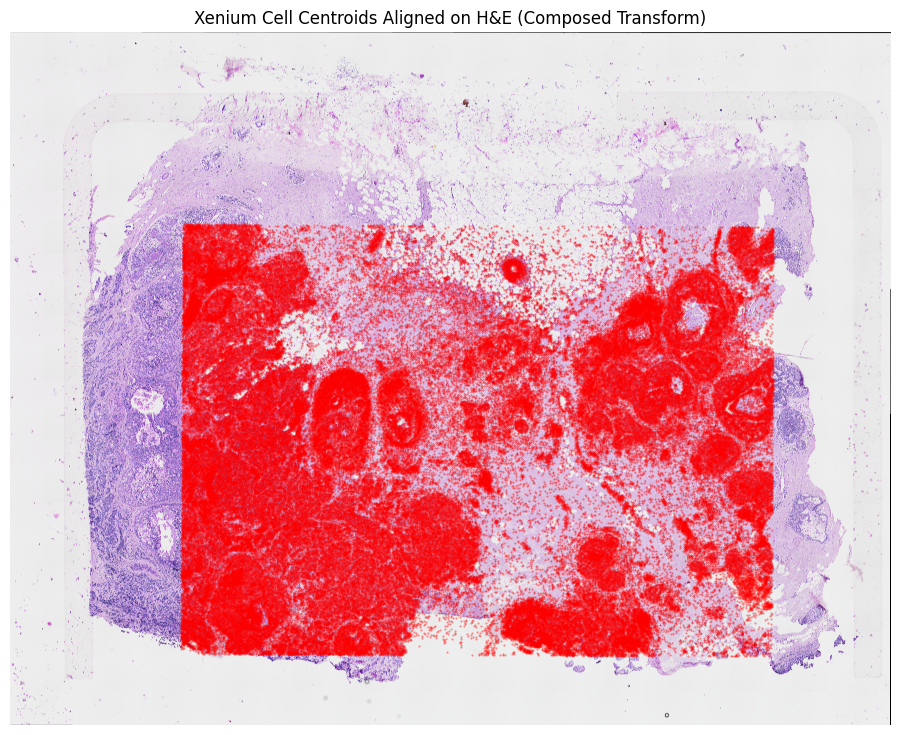

In [22]:
import os
import numpy as np
import pandas as pd
import zarr
import tifffile
import matplotlib.pyplot as plt
import json

# ---------------------------------------------------------------------
# 🧩 1. Paths — update as needed
# ---------------------------------------------------------------------
base = "/home/puneet/mk/data/10X_HumandBreastCancer_data"
cells_zarr_path = os.path.join(base, "Xenium_output/outs/cells.zarr.zip")
he_img_path = os.path.join(base, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif")
align_csv = os.path.join(base, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv")
experiment_json = os.path.join(base, "Xenium_output/outs/experiment.xenium")

# ---------------------------------------------------------------------
# 🧠 2. Load centroid & metadata
# ---------------------------------------------------------------------
cells_z = zarr.open(cells_zarr_path, mode='r')

cell_summary = np.array(cells_z['cell_summary'])  # (N, 7)
cell_ids = np.array(cells_z['cell_id'])
x_um = cell_summary[:, 0]
y_um = cell_summary[:, 1]

print(f"Loaded {len(x_um)} centroids")

# ---------------------------------------------------------------------
# 🧮 3. Load transforms
# ---------------------------------------------------------------------
T_he = pd.read_csv(align_csv, header=None).values
T_inv = np.linalg.inv(T_he)
print("\nAffine transform (H&E -> Xenium):\n", T_he)
print("\nInverse transform (Xenium -> H&E):\n", T_inv)

# Load mask transform (to get pixel scale)
mask_homog = np.array(cells_z['masks/homogeneous_transform'])
scale_from_mask = mask_homog[0, 0]  # 4.7058825 pixels/µm
print("\nMask homogeneous_transform:\n", mask_homog)
print(f"\nDetected pixel scale from mask: {scale_from_mask:.4f} pixels/µm")

# Load metadata to confirm pixel size
with open(experiment_json) as f:
    meta = json.load(f)
pixel_size_um = meta.get('pixel_size', 0.2125)
print(f"Pixel size (µm/pixel): {pixel_size_um}")

# ---------------------------------------------------------------------
# 🧩 4. Compose full transform (µm → H&E pixels)
# ---------------------------------------------------------------------
S = scale_from_mask
T_full = T_inv @ np.array([
    [S, 0, 0],
    [0, S, 0],
    [0, 0, 1]
])
print("\nComposed transform (µm → H&E pixels):\n", T_full)

# ---------------------------------------------------------------------
# 🧮 5. Apply transform to centroids
# ---------------------------------------------------------------------
coords_um = np.vstack([x_um, y_um, np.ones_like(x_um)])  # (3, N)
coords_px = T_full @ coords_um
x_px, y_px = coords_px[0], coords_px[1]

print(f"\nTransformed {len(x_px)} centroids into H&E pixel space")

# ---------------------------------------------------------------------
# 🖼️ 6. Load H&E image
# ---------------------------------------------------------------------
im = tifffile.imread(he_img_path)
if im.ndim == 3 and im.shape[0] in (3, 4):
    img_he = np.transpose(im[:3], (1, 2, 0))
elif im.ndim == 3 and im.shape[2] in (3, 4):
    img_he = im[:, :, :3]
elif im.ndim == 2:
    img_he = np.stack([im] * 3, axis=-1)
else:
    img_he = np.max(im, axis=0)
    if img_he.ndim == 2:
        img_he = np.stack([img_he] * 3, axis=-1)

H, W = img_he.shape[:2]
print(f"H&E image shape: {H} × {W}")

# ---------------------------------------------------------------------
# 🧭 7. Filter valid points (in image bounds)
# ---------------------------------------------------------------------
valid = (x_px >= 0) & (x_px < W) & (y_px >= 0) & (y_px < H)
print(f"Valid centroids within image bounds: {valid.sum()} / {len(valid)}")

# ---------------------------------------------------------------------
# 🎨 8. Visualize
# ---------------------------------------------------------------------
plt.figure(figsize=(12, 9))
plt.imshow(img_he, origin='upper')
plt.scatter(x_px[valid], y_px[valid], s=0.2, c='red', alpha=0.5)
plt.title("Xenium Cell Centroids Aligned on H&E (Composed Transform)")
plt.axis('off')
plt.show


Searching for optimal translation...
Best offset found: (np.int64(0), np.int64(0)), overlap score = 0.975


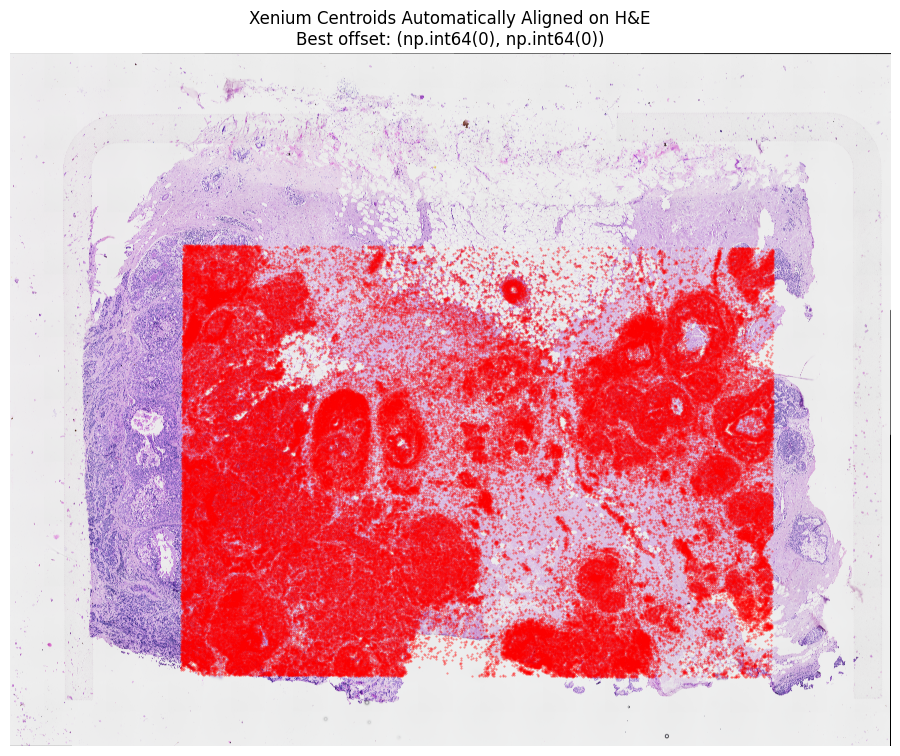


 Auto-alignment complete.


In [26]:
import os
import numpy as np
import pandas as pd
import zarr
import tifffile
import matplotlib.pyplot as plt
import json
from skimage.color import rgb2gray

# ---------------------------------------------------------------------
# Paths
# ---------------------------------------------------------------------
base = "/home/puneet/mk/data/10X_HumandBreastCancer_data"
cells_zarr_path = os.path.join(base, "Xenium_output/outs/cells.zarr.zip")
he_img_path = os.path.join(base, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif")
align_csv = os.path.join(base, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv")
experiment_json = os.path.join(base, "Xenium_output/outs/experiment.xenium")

# ---------------------------------------------------------------------
# 1️⃣ Load centroids and transforms
# ---------------------------------------------------------------------
cells_z = zarr.open(cells_zarr_path, mode="r")
cell_summary = np.array(cells_z["cell_summary"])
x_um, y_um = cell_summary[:, 0], cell_summary[:, 1]

T_he = pd.read_csv(align_csv, header=None).values
T_inv = np.linalg.inv(T_he)
mask_homog = np.array(cells_z["masks/homogeneous_transform"])
scale_from_mask = mask_homog[0, 0]  # ≈ 4.7059 px/µm

# Compose full transform (µm → H&E pixels)
S = scale_from_mask
T_full = T_inv @ np.array([[S, 0, 0],
                           [0, S, 0],
                           [0, 0, 1]])
coords_um = np.vstack([x_um, y_um, np.ones_like(x_um)])
coords_px = T_full @ coords_um
x_px, y_px = coords_px[0], coords_px[1]

# ---------------------------------------------------------------------
# 2️⃣ Load and preprocess H&E image
# ---------------------------------------------------------------------
im = tifffile.imread(he_img_path)
if im.ndim == 3 and im.shape[0] in (3, 4):
    img_he = np.transpose(im[:3], (1, 2, 0))
elif im.ndim == 3 and im.shape[2] in (3, 4):
    img_he = im[:, :, :3]
elif im.ndim == 2:
    img_he = np.stack([im] * 3, axis=-1)
else:
    img_he = np.max(im, axis=0)
    if img_he.ndim == 2:
        img_he = np.stack([img_he] * 3, axis=-1)

H, W = img_he.shape[:2]
gray = rgb2gray(img_he)

# Make tissue mask: dark = tissue, bright = background
mask_tissue = gray < 0.9  # tune threshold if needed

# ---------------------------------------------------------------------
# 3️⃣ Search translation offsets
# ---------------------------------------------------------------------
x_offsets = np.arange(-10000, 10001, 1000)
y_offsets = np.arange(-10000, 10001, 1000)
best_score, best_offsets = 0, (0, 0)

print("Searching for optimal translation...")
for dx in x_offsets:
    for dy in y_offsets:
        xi = np.clip((x_px + dx).astype(int), 0, W - 1)
        yi = np.clip((y_px + dy).astype(int), 0, H - 1)
        score = mask_tissue[yi, xi].mean()
        if score > best_score:
            best_score, best_offsets = score, (dx, dy)

print(f"Best offset found: {best_offsets}, overlap score = {best_score:.3f}")

# ---------------------------------------------------------------------
# 4️⃣ Apply best translation
# ---------------------------------------------------------------------
x_px_adj = x_px + best_offsets[0]
y_px_adj = y_px + best_offsets[1]

valid = (x_px_adj >= 0) & (x_px_adj < W) & (y_px_adj >= 0) & (y_px_adj < H)

# ---------------------------------------------------------------------
# 5️⃣ Visualize
# ---------------------------------------------------------------------
plt.figure(figsize=(12, 9))
plt.imshow(img_he, origin="upper")
plt.scatter(x_px_adj[valid], y_px_adj[valid], s=0.2, c="red", alpha=0.5)
plt.title(f"Xenium Centroids Automatically Aligned on H&E\nBest offset: {best_offsets}")
plt.axis("off")
plt.show()

print("\n Auto-alignment complete.")


Loaded 167780 centroids

Affine transform (H&E -> Xenium):
 [[ 1.71250106e+00  8.34508102e-03 -1.03971995e+04]
 [ 8.34508102e-03 -1.71250106e+00  3.72115390e+04]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Inverse transform (Xenium -> H&E):
 [[ 5.83927379e-01  2.84549972e-03  5.96532402e+03]
 [ 2.84549972e-03 -5.83927379e-01  2.17584216e+04]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Detected pixel scale from mask: 4.7059 pixels/µm
Pixel size (µm/pixel): 0.2125

Composed transform (µm → H&E pixels):
 [[ 2.74789366e+00  1.33905875e-02  5.96532402e+03]
 [ 1.33905875e-02 -2.74789366e+00  2.17584216e+04]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Transformed 167780 centroids into H&E pixel space
H&E image shape: 24241 × 30786
Valid centroids within image bounds: 167780 / 167780


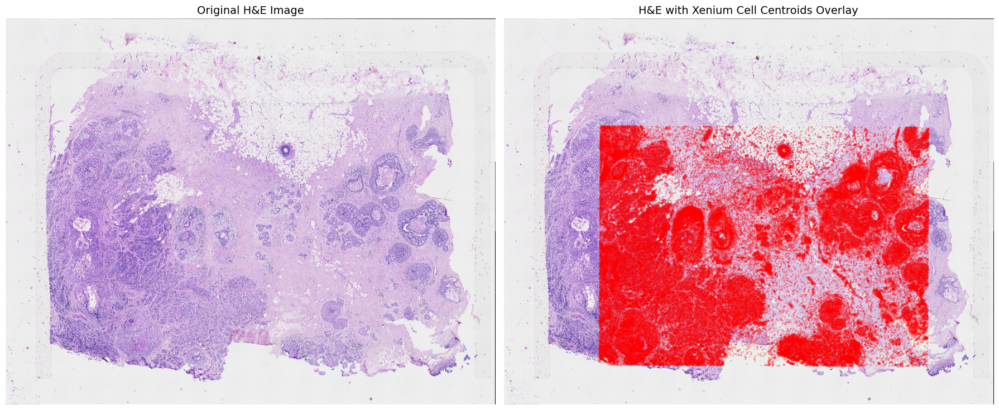

In [30]:
import os
import numpy as np
import pandas as pd
import zarr
import tifffile
import matplotlib.pyplot as plt
import json

# ---------------------------------------------------------------------
# 🧩 1. Paths
# ---------------------------------------------------------------------
base = "/home/puneet/mk/data/10X_HumandBreastCancer_data"
cells_zarr_path = os.path.join(base, "Xenium_output/outs/cells.zarr.zip")
he_img_path = os.path.join(base, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif")
align_csv = os.path.join(base, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv")
experiment_json = os.path.join(base, "Xenium_output/outs/experiment.xenium")

# ---------------------------------------------------------------------
# 🧠 2. Load centroid data
# ---------------------------------------------------------------------
cells_z = zarr.open(cells_zarr_path, mode='r')
cell_summary = np.array(cells_z['cell_summary'])
cell_ids = np.array(cells_z['cell_id'])
x_um = cell_summary[:, 0]   # cell_centroid_x
y_um = cell_summary[:, 1]   # cell_centroid_y

print(f"Loaded {len(x_um)} centroids")

# ---------------------------------------------------------------------
# 🧮 3. Load and compose transforms
# ---------------------------------------------------------------------
T_he = pd.read_csv(align_csv, header=None).values
T_inv = np.linalg.inv(T_he)

mask_homog = np.array(cells_z['masks/homogeneous_transform'])
scale_from_mask = mask_homog[0, 0]
with open(experiment_json) as f:
    meta = json.load(f)
pixel_size_um = meta.get('pixel_size', 0.2125)

print("\nAffine transform (H&E -> Xenium):\n", T_he)
print("\nInverse transform (Xenium -> H&E):\n", T_inv)
print(f"\nDetected pixel scale from mask: {scale_from_mask:.4f} pixels/µm")
print(f"Pixel size (µm/pixel): {pixel_size_um}")

S = scale_from_mask
T_full = T_inv @ np.array([[S, 0, 0], [0, S, 0], [0, 0, 1]])

print("\nComposed transform (µm → H&E pixels):\n", T_full)

# ---------------------------------------------------------------------
# 🧭 4. Transform centroids
# ---------------------------------------------------------------------
coords_um = np.vstack([x_um, y_um, np.ones_like(x_um)])
coords_px = T_full @ coords_um
x_px, y_px = coords_px[0], coords_px[1]
print(f"\nTransformed {len(x_px)} centroids into H&E pixel space")

# ---------------------------------------------------------------------
# 🖼️ 5. Load H&E image
# ---------------------------------------------------------------------
im = tifffile.imread(he_img_path)
if im.ndim == 3 and im.shape[0] in (3, 4):
    img_he = np.transpose(im[:3], (1, 2, 0))
elif im.ndim == 3 and im.shape[2] in (3, 4):
    img_he = im[:, :, :3]
elif im.ndim == 2:
    img_he = np.stack([im] * 3, axis=-1)
else:
    img_he = np.max(im, axis=0)
    if img_he.ndim == 2:
        img_he = np.stack([img_he] * 3, axis=-1)

H, W = img_he.shape[:2]
valid = (x_px >= 0) & (x_px < W) & (y_px >= 0) & (y_px < H)
print(f"H&E image shape: {H} × {W}")
print(f"Valid centroids within image bounds: {valid.sum()} / {len(valid)}")

# ---------------------------------------------------------------------
# 🎨 6. Show original vs overlay
# ---------------------------------------------------------------------
fig, axes = plt.subplots(1, 2, figsize=(18, 9))

# Original H&E image
axes[0].imshow(img_he, origin='upper')
axes[0].set_title("Original H&E Image", fontsize=14)
axes[0].axis('off')

# Overlayed image
axes[1].imshow(img_he, origin='upper')
axes[1].scatter(x_px[valid], y_px[valid], s=0.2, c='red', alpha=0.5)
axes[1].set_title("H&E with Xenium Cell Centroids Overlay", fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()


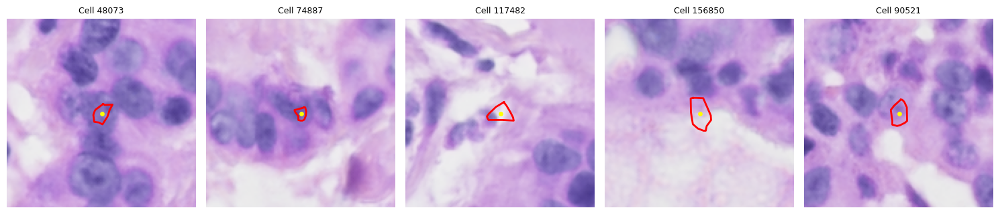

In [2]:
import h5py
import zarr
import numpy as np
import matplotlib.pyplot as plt
import random

# -----------------------------
# Paths
# -----------------------------
h5_patch_path = "/home/puneet/mk/data/10X_HumandBreastCancer_data/Processed_Output/cells_patches.h5"
zarr_path = "/home/puneet/mk/data/10X_HumandBreastCancer_data/Xenium_output/outs/cells.zarr.zip"

PATCH_SIZE = 128
CELL_POLY_IDX = 1  # 1 = cell boundary

# -----------------------------
# Load data
# -----------------------------
h5f = h5py.File(h5_patch_path, "r")
patches = h5f["patches"]
cell_ids_h5 = h5f["cell_ids"][:]

cells = zarr.open(zarr_path, mode="r")
cell_ids_zarr = cells["cell_id"][:]
cell_summary = cells["cell_summary"][:]        # centroids (µm)
polygon_vertices = cells["polygon_vertices"]
polygon_nverts = cells["polygon_num_vertices"]

# -----------------------------
# Pick 5 random cells
# -----------------------------
indices = random.sample(range(len(patches)), 5)

plt.figure(figsize=(15, 4))

for i, idx in enumerate(indices):
    patch = patches[idx]
    cell_id = cell_ids_h5[idx]

    # Find same cell in zarr
    zarr_idx = np.where(cell_ids_zarr == cell_id)[0][0]

    cx, cy = cell_summary[zarr_idx, 0], cell_summary[zarr_idx, 1]
    n_vert = polygon_nverts[CELL_POLY_IDX, zarr_idx]

    if n_vert < 3:
        continue

    # ---- FIX HERE ----
    raw_poly = polygon_vertices[CELL_POLY_IDX, zarr_idx, :2 * n_vert]
    poly = raw_poly.reshape(-1, 2)  # (N, 2)

    # Convert global → patch-local coordinates
    x_patch = poly[:, 0] - cx + PATCH_SIZE / 2
    y_patch = poly[:, 1] - cy + PATCH_SIZE / 2

    # -----------------------------
    # Plot
    # -----------------------------
    plt.subplot(1, 5, i + 1)
    plt.imshow(patch)
    plt.plot(x_patch, y_patch, "-r", linewidth=2)
    plt.scatter(PATCH_SIZE / 2, PATCH_SIZE / 2, c="yellow", s=15)
    plt.title(f"Cell {cell_id}", fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()

Prepared 167780 cell boundary polygons


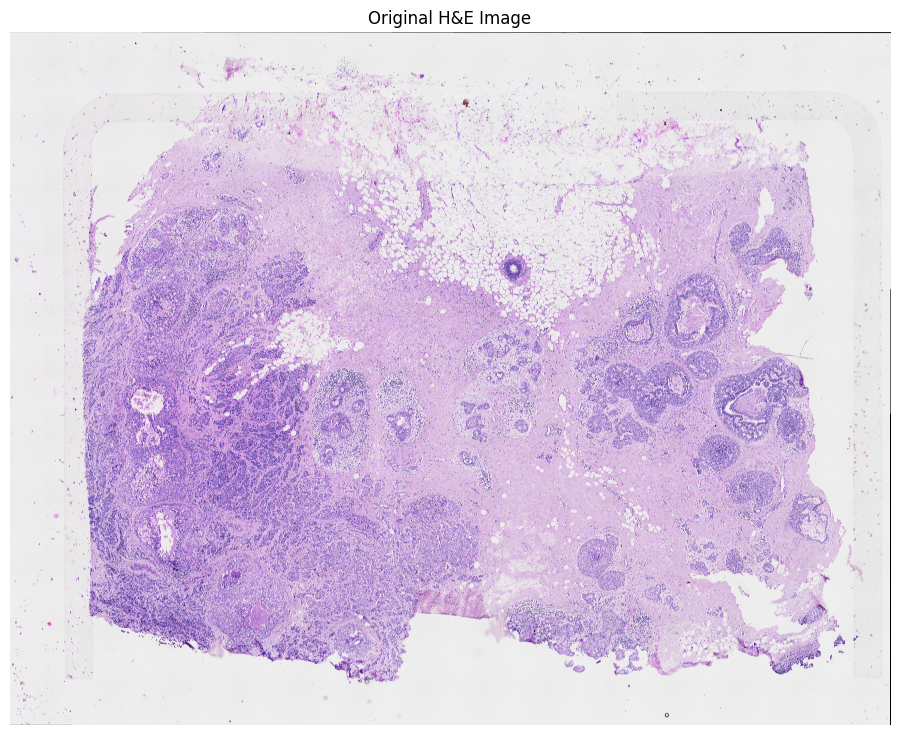

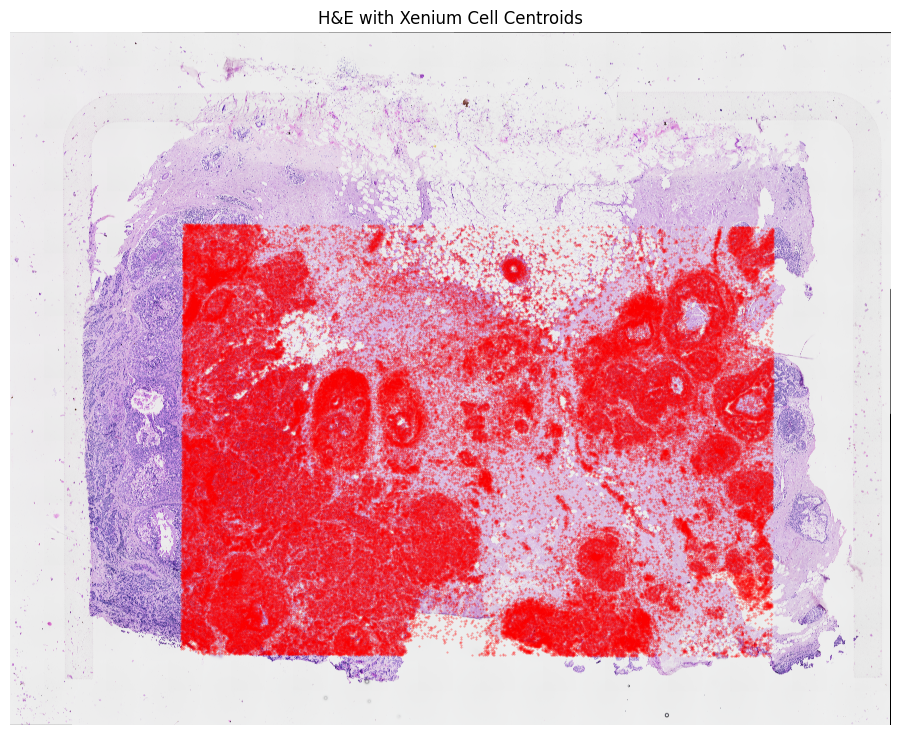

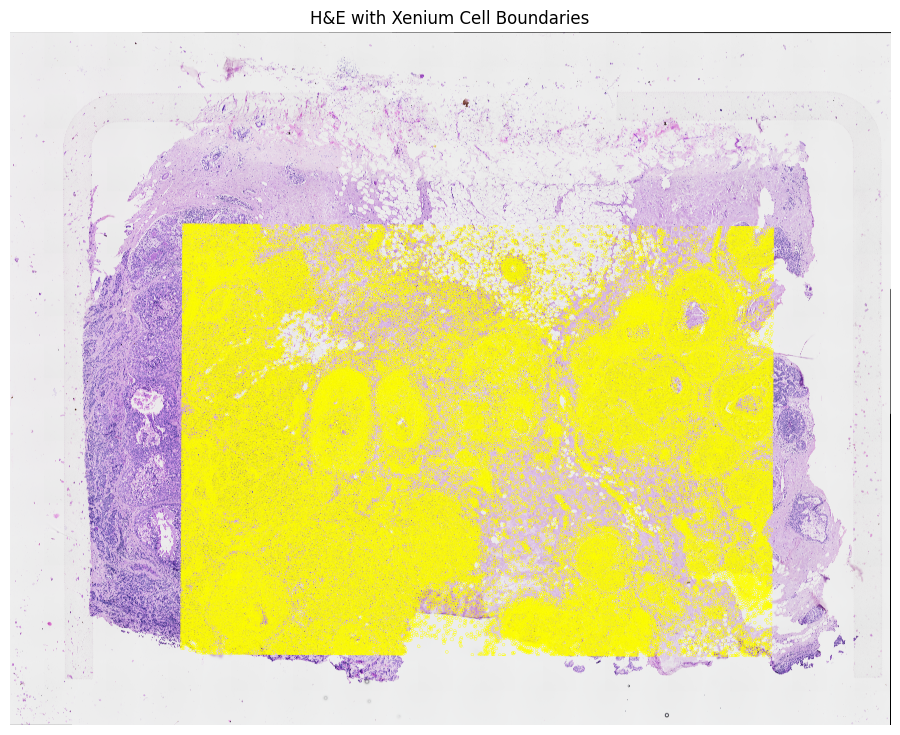

In [ ]:
import os
import numpy as np
import pandas as pd
import zarr
import tifffile
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from skimage.color import rgb2gray

# ---------------------------------------------------------------------
# Paths
# ---------------------------------------------------------------------
base = "/home/puneet/mk/data/10X_HumandBreastCancer_data"
cells_zarr_path = os.path.join(base, "Xenium_output/outs/cells.zarr.zip")
he_img_path = os.path.join(base, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif")
align_csv = os.path.join(base, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv")

# ---------------------------------------------------------------------
# 1️⃣ Load Zarr data
# ---------------------------------------------------------------------
z = zarr.open(cells_zarr_path, mode="r")

cell_ids = z["cell_id"][:]
cell_summary = z["cell_summary"][:]
polygon_vertices = z["polygon_vertices"]
polygon_num_vertices = z["polygon_num_vertices"]

cx_um = cell_summary[:, 0]
cy_um = cell_summary[:, 1]

# polygon_set_idx: 0 = nucleus, 1 = cell
POLY_SET_IDX = 1

# ---------------------------------------------------------------------
# 2️⃣ Load transform (µm → pixel)
# ---------------------------------------------------------------------
T_he = pd.read_csv(align_csv, header=None).values
T_inv = np.linalg.inv(T_he)

mask_homog = np.array(z["masks/homogeneous_transform"])
scale_from_mask = mask_homog[0, 0]   # px / µm

T_full = T_inv @ np.array([
    [scale_from_mask, 0, 0],
    [0, scale_from_mask, 0],
    [0, 0, 1]
])

coords_um = np.vstack([cx_um, cy_um, np.ones_like(cx_um)])
coords_px = T_full @ coords_um
cx_px, cy_px = coords_px[0], coords_px[1]

# ---------------------------------------------------------------------
# 3️⃣ Load H&E image
# ---------------------------------------------------------------------
im = tifffile.imread(he_img_path)

if im.ndim == 3 and im.shape[0] in (3, 4):
    img_he = np.transpose(im[:3], (1, 2, 0))
elif im.ndim == 3 and im.shape[2] in (3, 4):
    img_he = im[:, :, :3]
else:
    img_he = np.stack([im] * 3, axis=-1)

H, W = img_he.shape[:2]

# ---------------------------------------------------------------------
# 4️⃣ Prepare all cell boundary line segments
# ---------------------------------------------------------------------
segments = []

for idx in range(len(cell_ids)):
    n_vert = polygon_num_vertices[POLY_SET_IDX, idx]
    if n_vert < 3:
        continue

    poly_flat = polygon_vertices[POLY_SET_IDX, idx, :2 * n_vert]
    poly_um = poly_flat.reshape(-1, 2)

    # µm → pixel
    poly_px = (T_full @ np.vstack([
        poly_um[:, 0],
        poly_um[:, 1],
        np.ones(n_vert)
    ]))[:2].T

    # Close polygon
    poly_px = np.vstack([poly_px, poly_px[0]])

    # Keep only valid polygons
    if (
        poly_px[:, 0].min() < 0 or poly_px[:, 0].max() >= W or
        poly_px[:, 1].min() < 0 or poly_px[:, 1].max() >= H
    ):
        continue

    segments.append(poly_px)

print(f"Prepared {len(segments)} cell boundary polygons")

# ---------------------------------------------------------------------
# 5️⃣ Visualization
# ---------------------------------------------------------------------

# ---- FIGURE 1: Original H&E ----
plt.figure(figsize=(12, 9))
plt.imshow(img_he)
plt.title("Original H&E Image")
plt.axis("off")
plt.show()

# ---- FIGURE 2: Centroids ----
plt.figure(figsize=(12, 9))
plt.imshow(img_he)
plt.scatter(cx_px, cy_px, s=0.2, c="red", alpha=0.4)
plt.title("H&E with Xenium Cell Centroids")
plt.axis("off")
plt.show()

# ---- FIGURE 3: Cell Boundaries ----
plt.figure(figsize=(12, 9))
plt.imshow(img_he)

lc = LineCollection(
    segments,
    colors="green",
    linewidths=0.4,
    alpha=0.7
)
plt.gca().add_collection(lc)

plt.title("H&E with Xenium Cell Boundaries")
plt.axis("off")
plt.show()


Loaded 167780 cells
Valid cells inside image: 167780
Displaying 5 example cells...


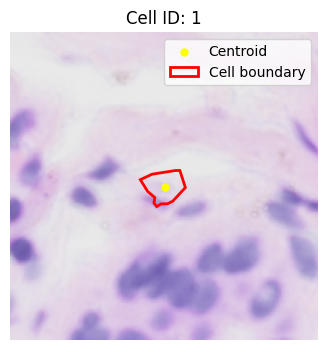

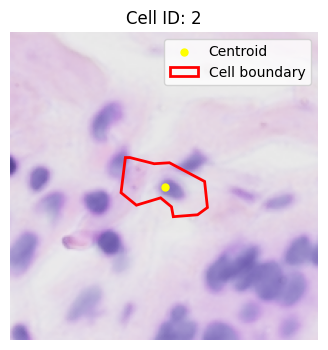

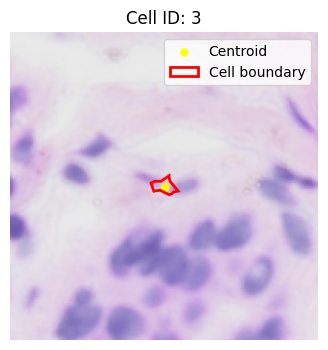

Done.


In [19]:
import os
import random
import numpy as np
import pandas as pd
import zarr
import tifffile
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

# ============================================================
# PATHS
# ============================================================
BASE = "/home/puneet/mk/data/10X_HumandBreastCancer_data"

CELLS_ZARR = os.path.join(BASE, "Xenium_output/outs/cells.zarr.zip")
HE_IMAGE = os.path.join(BASE, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_image.ome.tif")
ALIGN_CSV = os.path.join(BASE, "Xenium_FFPE_Human_Breast_Cancer_Rep1_he_imagealignment.csv")
EXPERIMENT_JSON = os.path.join(BASE, "Xenium_output/outs/experiment.xenium")

PATCH_SIZE = 200
POLY_SET_IDX = 1   # 0 = nucleus, 1 = cell boundary

# ============================================================
# LOAD ZARR DATA
# ============================================================
cells = zarr.open(CELLS_ZARR, mode="r")

cell_summary = np.array(cells["cell_summary"])
cell_ids = np.array(cells["cell_id"])

x_um = cell_summary[:, 0]
y_um = cell_summary[:, 1]

polygon_vertices = np.array(cells["polygon_vertices"])
polygon_nv = np.array(cells["polygon_num_vertices"])

print(f"Loaded {len(cell_ids)} cells")

# ============================================================
# LOAD TRANSFORM
# ============================================================
T_he = pd.read_csv(ALIGN_CSV, header=None).values
T_inv = np.linalg.inv(T_he)

mask_tf = np.array(cells["masks/homogeneous_transform"])
scale = mask_tf[0, 0]  # px / µm

T_full = T_inv @ np.array([
    [scale, 0, 0],
    [0, scale, 0],
    [0, 0, 1]
])

# ============================================================
# APPLY TRANSFORM TO CENTROIDS
# ============================================================
coords_um = np.vstack([x_um, y_um, np.ones_like(x_um)])
coords_px = T_full @ coords_um

x_px = coords_px[0]
y_px = coords_px[1]

# ============================================================
# LOAD H&E IMAGE
# ============================================================
img = tifffile.imread(HE_IMAGE)

if img.ndim == 3 and img.shape[0] in (3, 4):
    img = np.transpose(img[:3], (1, 2, 0))
elif img.ndim == 3 and img.shape[2] in (3, 4):
    img = img[:, :, :3]
elif img.ndim == 2:
    img = np.stack([img] * 3, axis=-1)
else:
    img = np.max(img, axis=0)
    img = np.stack([img] * 3, axis=-1)

H, W = img.shape[:2]

# IMPORTANT: Y-axis flip (image coordinate system)
y_px = H - y_px

# ============================================================
# FILTER VALID CELLS
# ============================================================
valid = (
    (x_px >= PATCH_SIZE // 2) &
    (x_px < W - PATCH_SIZE // 2) &
    (y_px >= PATCH_SIZE // 2) &
    (y_px < H - PATCH_SIZE // 2)
)

x_px = x_px[valid]
y_px = y_px[valid]
cell_ids = cell_ids[valid]

polygon_vertices = polygon_vertices[:, valid, :]
polygon_nv = polygon_nv[:, valid]

print(f"Valid cells inside image: {len(x_px)}")

# ============================================================
# VISUALIZATION FUNCTION
# ============================================================
def show_patch_with_polygon(idx):
    cx, cy = x_px[idx], y_px[idx]
    half = PATCH_SIZE // 2

    x1, y1 = int(cx - half), int(cy - half)
    x2, y2 = x1 + PATCH_SIZE, y1 + PATCH_SIZE

    patch = img[y1:y2, x1:x2].copy()

    # ---------- Decode polygon correctly ----------
    n_vert = polygon_nv[POLY_SET_IDX, idx]

    # Xenium polygons are interleaved: [x0,y0,x1,y1,...]
    poly_flat = polygon_vertices[POLY_SET_IDX, idx, :2 * n_vert]
    poly_um = poly_flat.reshape(-1, 2)

    # µm → pixel
    poly_h = np.c_[poly_um, np.ones(len(poly_um))].T
    poly_px = T_full @ poly_h

    poly_x = poly_px[0]
    poly_y = H - poly_px[1]  # Y flip

    # pixel → patch coordinates
    poly_xp = poly_x - cx + half
    poly_yp = poly_y - cy + half

    # ---------- Plot ----------
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.imshow(patch)

    ax.scatter(half, half, c="yellow", s=25, label="Centroid")

    ax.add_patch(
        Polygon(
            np.c_[poly_xp, poly_yp],
            closed=True,
            fill=False,
            edgecolor="red",
            linewidth=2,
            label="Cell boundary"
        )
    )

    ax.set_title(f"Cell ID: {cell_ids[idx]}")
    ax.legend()
    ax.axis("off")
    plt.show()

# ============================================================
# DISPLAY 5 RANDOM CELLS
# ============================================================
print("Displaying 5 example cells...")
for idx in range(3):
    show_patch_with_polygon(idx)

print("Done.")